# Imports and Setup

In [2]:
import pandas as pd
import numpy as np
import altair as alt
import geopandas as gpd
import json
import os

# ignore warnings
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn
warnings.filterwarnings("ignore", category=Warning)
print('Warnings will be ignored!')

Warnings will be ignored!


In [3]:
# enable altair visualizations
alt.renderers.enable()

RendererRegistry.enable('default')

In [4]:
alt.themes.enable('opaque')

ThemeRegistry.enable('opaque')

# Data

In [5]:
geo_json_file_loc= 'toronto_crs84.geojson'
# shape_file_loc = 'NEIGHBORHOODS_WGS84.shp'

def open_geojson():
    with open(geo_json_file_loc) as json_data:
        d = json.load(json_data)
    return d

def get_gpd_df(use_shape_file=True):
    if use_shape_file:
        gdf = gpd.read_file(shape_file_loc)
    else:
        toronto_json = open_geojson()
        gdf = gpd.GeoDataFrame.from_features((toronto_json))
    return gdf

In [6]:
gdf = get_gpd_df(use_shape_file=False)
gdf.head()

,AREA_NAME,AREA_S_CD,geometry
0,Yonge-St.Clair (97),097,POLYGON ((-79.39119482699992 43.68108112399995...
1,York University Heights (27),027,POLYGON ((-79.50528791599992 43.75987349399995...
2,Lansing-Westgate (38),038,POLYGON ((-79.43998431099992 43.76155765499995...
3,Yorkdale-Glen Park (31),031,POLYGON ((-79.43968732599991 43.70560981799996...
4,Stonegate-Queensway (16),016,"POLYGON ((-79.49262119699992 43.6474363499999,..."


In [7]:
df = pd.read_csv('toronto_crime_data.csv')
df['AREA_S_CD'] = df['AREA_S_CD'].astype(str)

for i in range(len(df)):
    if len(df['AREA_S_CD'][i]) == 2:
        df['AREA_S_CD'][i] = '0' + df['AREA_S_CD'][i]
    elif len(df['AREA_S_CD'][i]) == 1:
        df['AREA_S_CD'][i] = '00' + df['AREA_S_CD'][i]

In [8]:
gdf = gdf.merge(df, left_on='AREA_NAME', right_on='Neighbourhood', how='inner')

In [9]:
gdf.head()

,AREA_NAME,AREA_S_CD_x,geometry,OBJECTID,AREA_S_CD_y,Neighbourhood,Assault_2014,AutoTheft_2014,BreakandEnter_2014,Robbery_2014,...,Population,Assault_Rate,AutoTheft_Rate,BreakandEnter_Rate,Robbery_Rate,TheftOver_Rate,Homicide_Rate,Total_Rate,Shape__Area,Shape__Length
0,Yonge-St.Clair (97),097,POLYGON ((-79.39119482699992 43.68108112399995...,1,097,Yonge-St.Clair (97),16,3,32,2,...,3189,721.229225,94.073377,533.082471,62.715585,94.073377,0.000000,1505.174036,1.161309e+06,5873.097806
1,York University Heights (27),027,POLYGON ((-79.50528791599992 43.75987349399995...,2,027,York University Heights (27),269,118,98,60,...,36764,859.536503,282.885431,288.325536,195.843760,97.921880,2.720052,1729.953215,1.324698e+07,18504.936210
2,Lansing-Westgate (38),038,POLYGON ((-79.43998431099992 43.76155765499995...,3,038,Lansing-Westgate (38),38,16,41,10,...,10242,517.477055,205.038078,371.021285,78.109744,48.818590,0.000000,1220.464753,5.346378e+06,11112.316460
3,Yorkdale-Glen Park (31),031,POLYGON ((-79.43968732599991 43.70560981799996...,4,031,Yorkdale-Glen Park (31),106,63,51,23,...,18233,795.261339,285.197170,318.104536,142.598585,120.660341,5.484561,1661.821971,6.038420e+06,10079.442750
4,Stonegate-Queensway (16),016,"POLYGON ((-79.49262119699992 43.6474363499999,...",5,016,Stonegate-Queensway (16),93,35,68,14,...,22207,378.259108,130.589454,238.663485,72.049354,31.521592,0.000000,851.082992,7.946086e+06,11853.054620


In [10]:
gdf.columns

Index(['AREA_NAME', 'AREA_S_CD_x', 'geometry', 'OBJECTID', 'AREA_S_CD_y',
       'Neighbourhood', 'Assault_2014', 'AutoTheft_2014', 'BreakandEnter_2014',
       'Robbery_2014', 'TheftOver_2014', 'Homicide_2014', 'Total_2014',
       'Assault_2015', 'AutoTheft_2015', 'BreakandEnter_2015', 'Robbery_2015',
       'TheftOver_2015', 'Homicide_2015', 'Total_2015', 'Assault_2016',
       'AutoTheft_2016', 'BreakandEnter_2016', 'Robbery_2016',
       'TheftOver_2016', 'Homicide_2016', 'Total_2016', 'Assault_2017',
       'AutoTheft_2017', 'BreakandEnter_2017', 'Robbery_2017',
       'TheftOver_2017', 'Homicide_2017', 'Total_2017', 'Assault_AVG',
       'AutoTheft_AVG', 'BreakandEnter_AVG', 'Robbery_AVG', 'TheftOver_AVG',
       'Homicide_AVG', 'Total_AVG', 'Assault_ch', 'AutoTheft_ch',
       'BreakandEnter_ch', 'Robbery_ch', 'TheftOver_ch', 'Homicide_ch',
       'Total_ch', 'Population', 'Assault_Rate', 'AutoTheft_Rate',
       'BreakandEnter_Rate', 'Robbery_Rate', 'TheftOver_Rate', 'Homicide

In [11]:
choro_json = json.loads(gdf.to_json())
choro_data = alt.Data(values=choro_json['features'])

In [21]:
def gen_map(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=700,
        height=600
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Crime Rate"),
         tooltip=tooltip
    )
    
    return base + choro

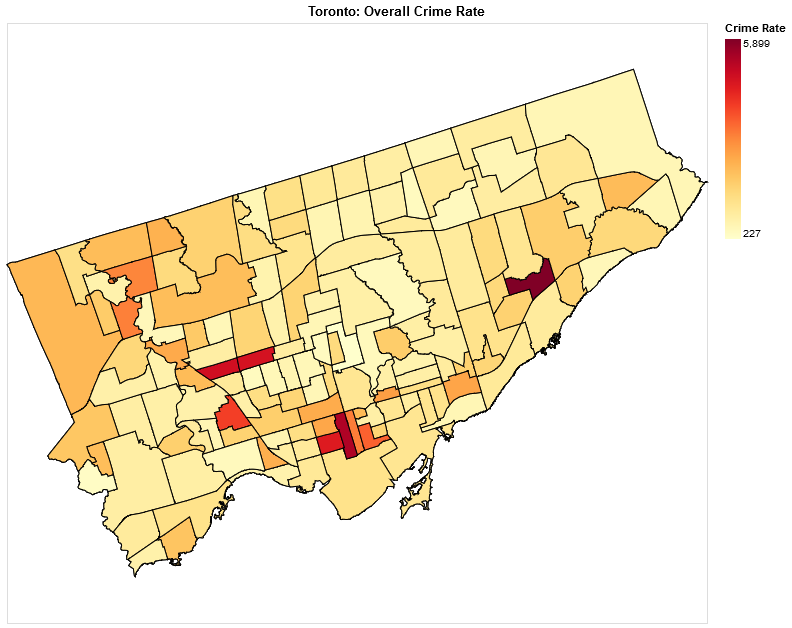

In [22]:
toronto_map = gen_map(geodata=choro_data, color_column='properties.Total_Rate', 
                      title='Toronto: Overall Crime Rate', tooltip=[alt.Tooltip('properties.AREA_NAME:O', title="Neighborhood"), alt.Tooltip('properties.Total_Rate:Q', title="Overall Crime Rate")], 
                      color_scheme='yelloworangered')

toronto_map

In [15]:
toronto_map.save('toronto_map.json')

In [23]:
toronto_map.save('toronto_map.html')

In [4]:
!pip install vega_datasets

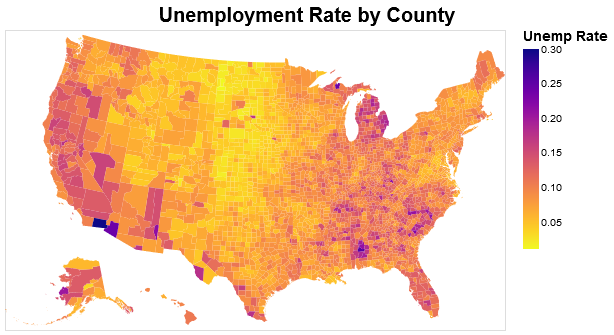

In [13]:
from vega_datasets import data

counties = alt.topo_feature(data.us_10m.url, 'counties')
source = data.unemployment.url

foreground = alt.Chart(counties).mark_geoshape(
    ).encode(
    color=alt.Color('rate:Q', sort="descending",  scale=alt.Scale(scheme='plasma'), legend=alt.Legend(title="Unemp Rate", tickCount=6))
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(source, 'id', ['rate'])
).project(
    type='albersUsa'
).properties(
    title="Unemployment Rate by County",
    width=500,
    height=300
)

config = alt.layer(foreground).configure_title(fontSize=20, anchor="middle").configure_legend(titleColor='black', titleFontSize=14, gradientHeight=60, gradientWidth=30) 

config
